# **Nithyashree Manohar**

# **Data Creation**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
from PIL import Image
import os

DATA_DIR = "/content/drive/MyDrive/thumbsup_instance"
OUT_DIR = "/content/thumbs_ins_out"

if not os.path.isdir(OUT_DIR):
	os.makedirs(OUT_DIR)

for file in os.listdir(DATA_DIR):
	if not file.endswith(".jpg"):
		continue

	img = Image.open(os.path.join(DATA_DIR, file))

	width, height = img.size

	edge_buffer = 10

	img1 = img.crop((edge_buffer, edge_buffer, width//2 - edge_buffer, height//2 - edge_buffer))
	img1.save(os.path.join(OUT_DIR, file.split('.')[0]+"_1.jpg"))
	img2 = img.crop((width//2 + edge_buffer, edge_buffer, width - edge_buffer, height//2 - edge_buffer))
	img2.save(os.path.join(OUT_DIR, file.split('.')[0]+"_2.jpg"))
	img3 = img.crop((edge_buffer, height//2 + edge_buffer, width//2 - edge_buffer, height - edge_buffer))
	img3.save(os.path.join(OUT_DIR, file.split('.')[0]+"_3.jpg"))
	img4 = img.crop((width//2 + edge_buffer, height//2 + edge_buffer, width - edge_buffer, height - edge_buffer))
	img4.save(os.path.join(OUT_DIR, file.split('.')[0]+"_4.jpg"))

# **Stable Diffusion v 1.5**

In [4]:
!git clone https://github.com/huggingface/peft

Cloning into 'peft'...
remote: Enumerating objects: 3329, done.
remote: Counting objects: 100% (1199/1199), done.
remote: Compressing objects: 100% (265/265), done.
remote: Total 3329 (delta 1064), reused 958 (delta 925), pack-reused 2130
Receiving objects: 100% (3329/3329), 6.90 MiB | 24.80 MiB/s, done.
Resolving deltas: 100% (2108/2108), done.


In [5]:
%cd peft/examples/lora_dreambooth

/content/peft/examples/lora_dreambooth


In [6]:
!pwd

/content/peft/examples/lora_dreambooth


In [7]:
!pip install -r requirements.txt
!pip install git+https://github.com/huggingface/peft

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 55.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.6/227.6 kB 29.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.4/81.4 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.2/486.2 kB 49.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 81.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.5/268.5 kB 29.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 83.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 108.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 14.6 MB/s eta 0:00:00
  Cloning https://github.com/huggingface/peft to /tmp/pip-req-build-4saq8t6w
  Running command git clone --filter=bl

In [8]:
!pip install tensorrt

  Preparing metadata (setup.py) ... done
  Created wheel for tensorrt: filename=tensorrt-8.6.1-py2.py3-none-any.whl size=16973 sha256=a3bfd9bb447f3b75b896fbad5f1d3a14f5ab2923940484a8e8b6820eca914fca
  Stored in directory: /root/.cache/pip/wheels/6d/29/56/abdffd4c604f255b5254bef3f1c598ab7811ea020540599438
Successfully built tensorrt


In [9]:
output_model_dir = "/content/output_model"
if not os.path.isdir(output_model_dir):
    os.makedirs(output_model_dir)

In [10]:
from accelerate.utils import write_basic_config
write_basic_config()

PosixPath('/root/.cache/huggingface/accelerate/default_config.yaml')

In [11]:
!accelerate launch train_dreambooth.py \
  --pretrained_model_name_or_path="runwayml/stable-diffusion-v1-5" \
  --instance_data_dir="/content/thumbs_ins_out" \
  --class_data_dir="/content/drive/MyDrive/thumbsup_class" \
  --output_dir="/content/output_model" \
  --train_text_encoder \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --instance_prompt="a photo of Alexa thumbs up gesture" \
  --class_prompt="a photo of person thumbs up gesture" \
  --resolution=512 \
  --train_batch_size=1 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --num_class_images=200 \
  --use_lora \
  --lora_r 16 \
  --lora_alpha 27 \
  --lora_text_encoder_r 16 \
  --lora_text_encoder_alpha 17 \
  --learning_rate=5e-5 \
  --gradient_accumulation_steps=1 \
  --gradient_checkpointing \
  --max_train_steps=1000

2023-07-06 23:15:29.180468: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-07-06 23:15:43.345976: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
07/06/2023 23:15:47 - INFO - __main__ - Distributed environment: NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: no

You are using a model of type clip_text_model to instantiate a model of type . This is not supported for all configurations of models and can yield errors.
{'scaling_factor'} was not found in config. Values will be initialized to default values.
{'transformer_layers_per_block', 'encoder_hid_dim_type', 'dual_cross_attention', 'encoder_hid_dim', 'class_embeddings_concat', 'addition_time_embed_dim', 'mid_block_only_cross_attention', 'conv_out_kernel', 'resnet_time_scale_shift', 'only_cross_attention', 'num_attention_heads', 'class_embed_type', 'num_class_embeds', 'projection_class_em

# **Inference**

In [12]:
import os
import torch

from diffusers import StableDiffusionPipeline
from peft import PeftModel, LoraConfig

MODEL_NAME = "runwayml/stable-diffusion-v1-5"

In [13]:
def get_lora_sd_pipeline(
    ckpt_dir, base_model_name_or_path=None, dtype=torch.float16, device="cuda", adapter_name="default"
):
    unet_sub_dir = os.path.join(ckpt_dir, "unet")
    text_encoder_sub_dir = os.path.join(ckpt_dir, "text_encoder")
    if os.path.exists(text_encoder_sub_dir) and base_model_name_or_path is None:
        config = LoraConfig.from_pretrained(text_encoder_sub_dir)
        base_model_name_or_path = config.base_model_name_or_path

    if base_model_name_or_path is None:
        raise ValueError("Please specify the base model name or path")

    pipe = StableDiffusionPipeline.from_pretrained(base_model_name_or_path, torch_dtype=dtype).to(device)
    pipe.unet = PeftModel.from_pretrained(pipe.unet, unet_sub_dir, adapter_name=adapter_name)

    if os.path.exists(text_encoder_sub_dir):
        pipe.text_encoder = PeftModel.from_pretrained(
            pipe.text_encoder, text_encoder_sub_dir, adapter_name=adapter_name
        )

    if dtype in (torch.float16, torch.bfloat16):
        pipe.unet.half()
        pipe.text_encoder.half()

    pipe.to(device)
    return pipe

In [14]:
pipe = get_lora_sd_pipeline("/content/output_model", adapter_name="Alexa")

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [15]:
output_images_dir = "/content/output_images"
if not os.path.isdir(output_images_dir):
    os.makedirs(output_images_dir)

  0%|          | 0/50 [00:00<?, ?it/s]

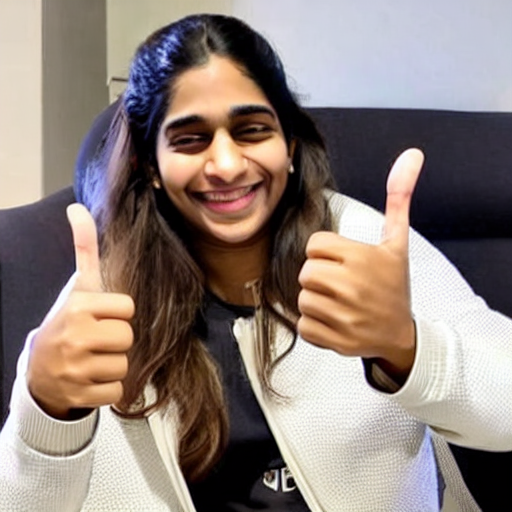

  0%|          | 0/50 [00:00<?, ?it/s]

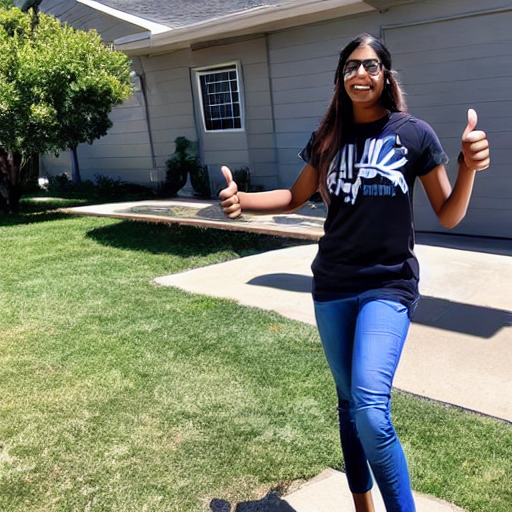

  0%|          | 0/50 [00:00<?, ?it/s]

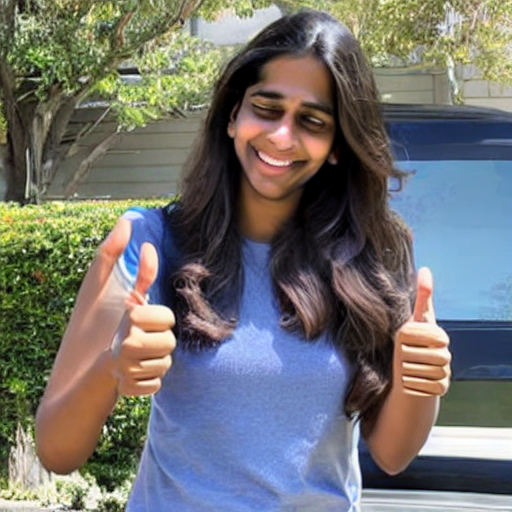

  0%|          | 0/50 [00:00<?, ?it/s]

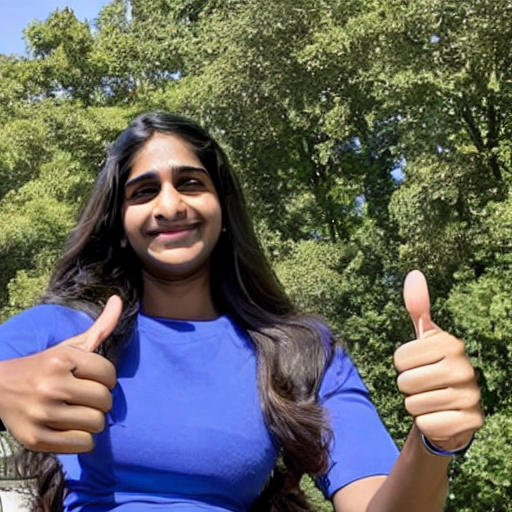

  0%|          | 0/50 [00:00<?, ?it/s]

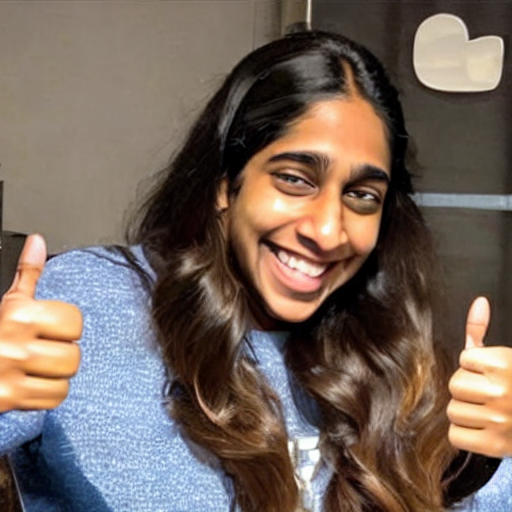

  0%|          | 0/50 [00:00<?, ?it/s]

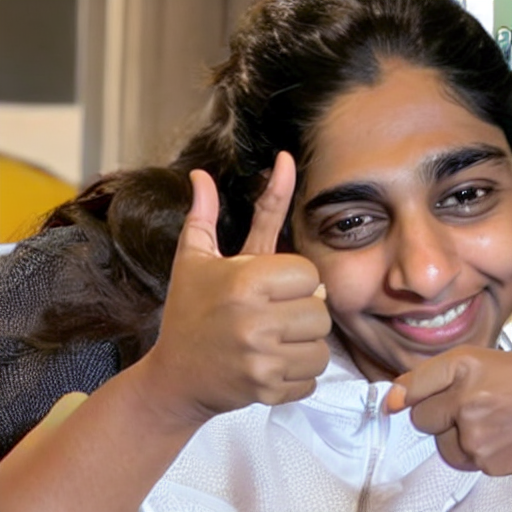

  0%|          | 0/50 [00:00<?, ?it/s]

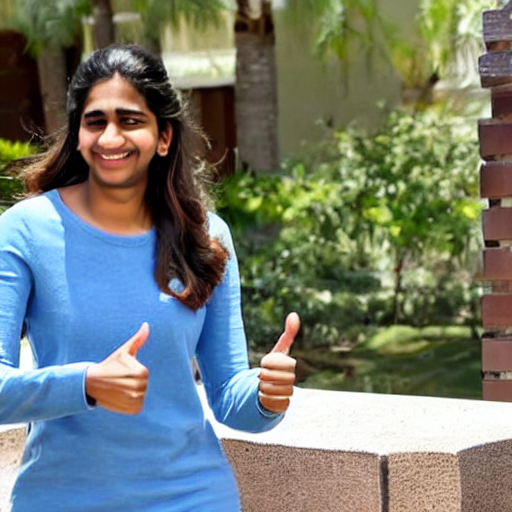

  0%|          | 0/50 [00:00<?, ?it/s]

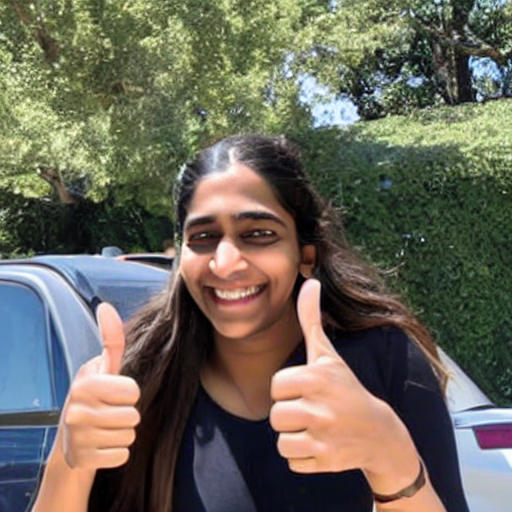

  0%|          | 0/50 [00:00<?, ?it/s]

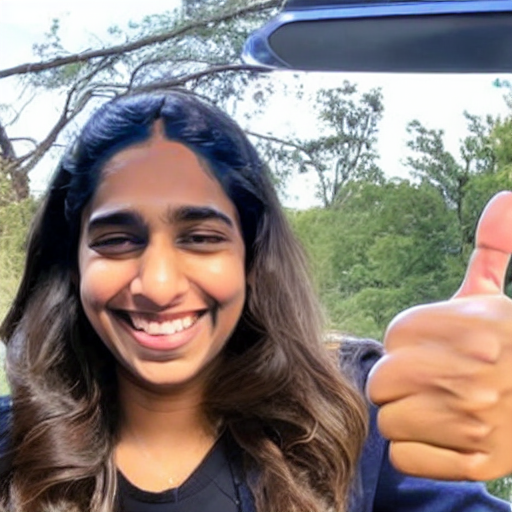

  0%|          | 0/50 [00:00<?, ?it/s]

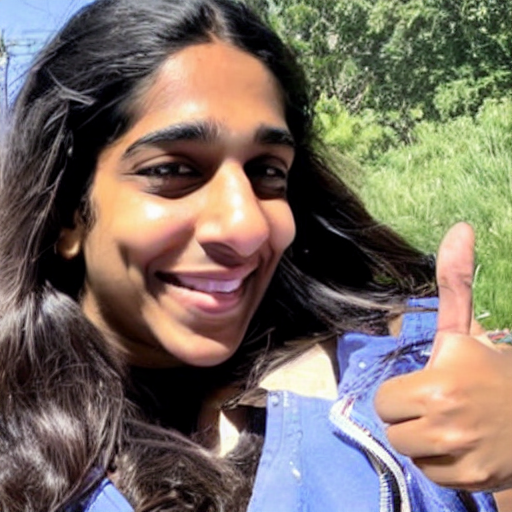

  0%|          | 0/50 [00:00<?, ?it/s]

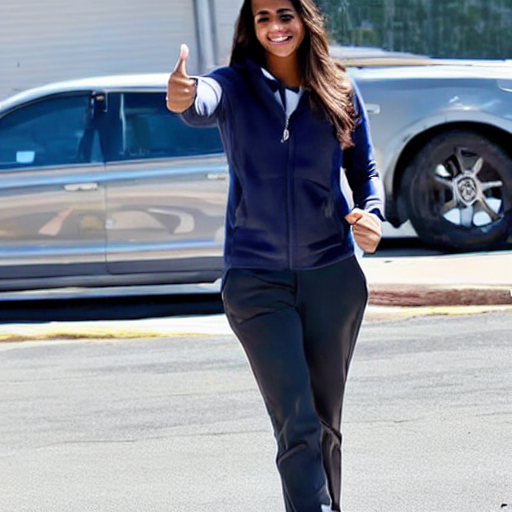

  0%|          | 0/50 [00:00<?, ?it/s]

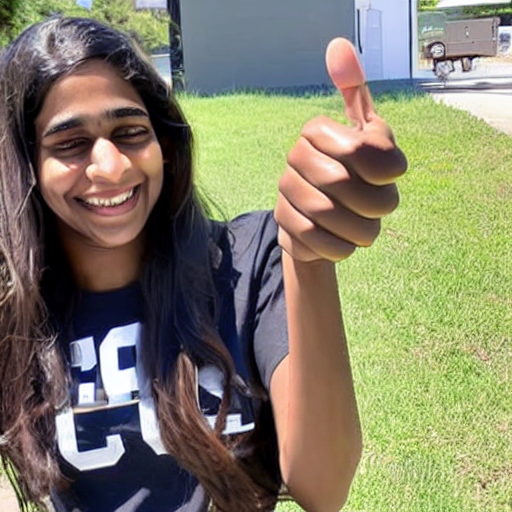

  0%|          | 0/50 [00:00<?, ?it/s]

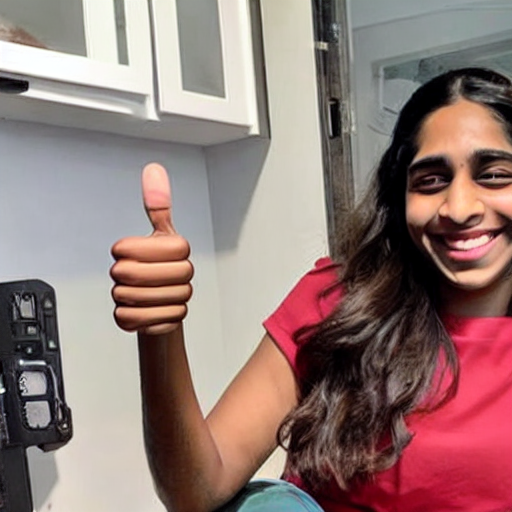

  0%|          | 0/50 [00:00<?, ?it/s]

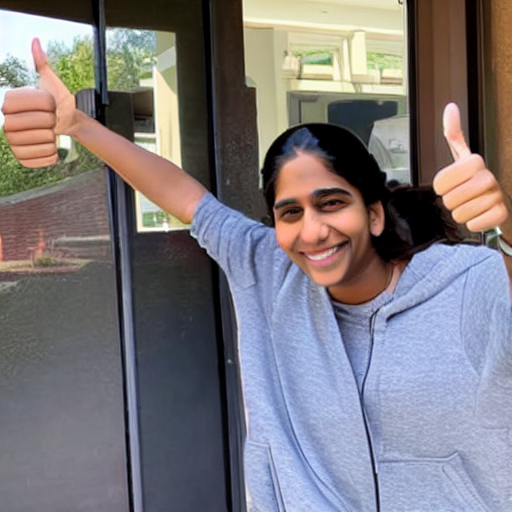

  0%|          | 0/50 [00:00<?, ?it/s]

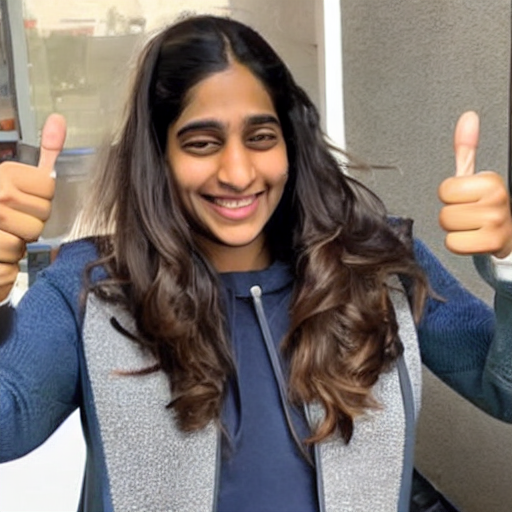

  0%|          | 0/50 [00:00<?, ?it/s]

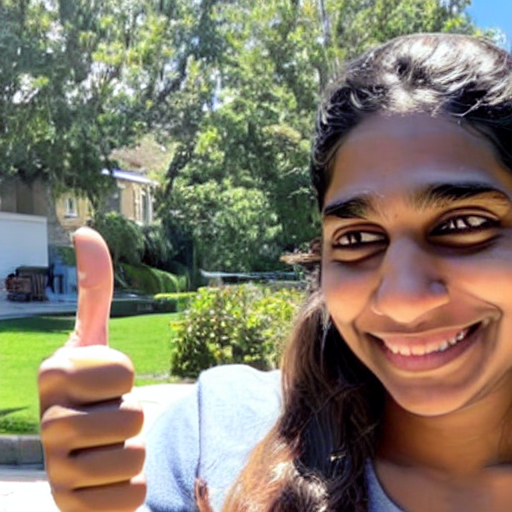

  0%|          | 0/50 [00:00<?, ?it/s]

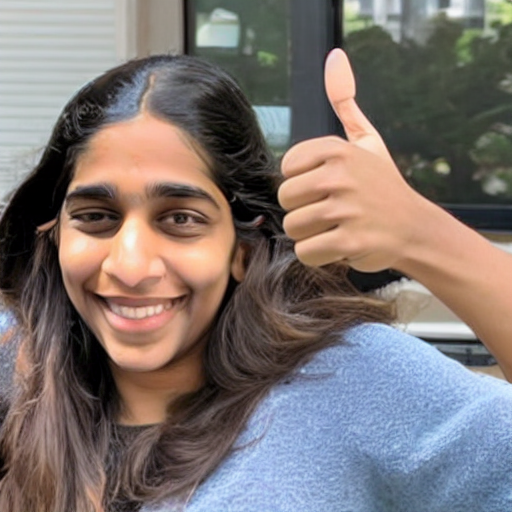

  0%|          | 0/50 [00:00<?, ?it/s]

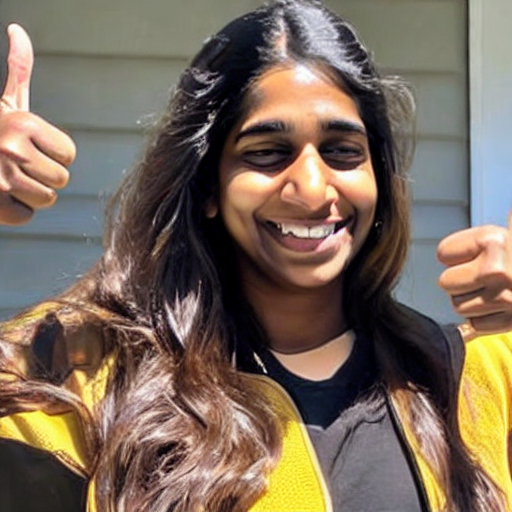

  0%|          | 0/50 [00:00<?, ?it/s]

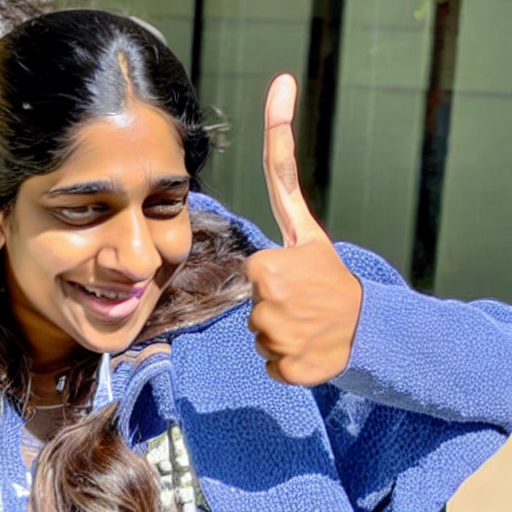

  0%|          | 0/50 [00:00<?, ?it/s]

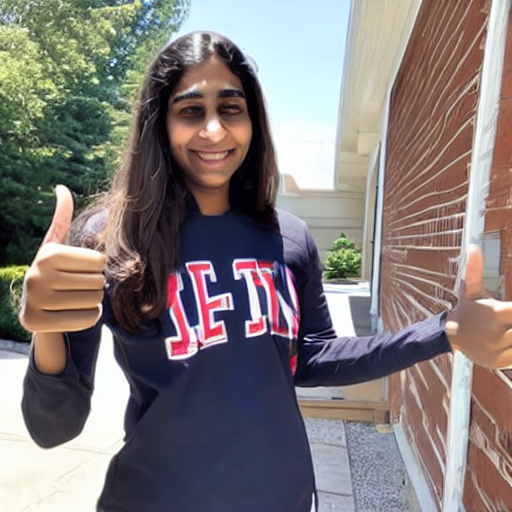

In [19]:
import os
from PIL import Image

def generate_images(prompt, output_dir, negative_prompt, num_images=20):

    for i in range(num_images):
        image = pipe(prompt, num_inference_steps=50, guidance_scale=7, negative_prompt=negative_prompt).images[0]
        image_path = os.path.join(output_dir, f"out{i+1}.jpg")
        image.save(image_path)
        image.show()

prompt = "Alexa with a thumbs up gesture"
negative_prompt = "low quality, blurry, unfinished, moustache"
generate_images(prompt, output_images_dir, negative_prompt, num_images=20)


In [ ]:
# %cp -av "/content/output_model" "/content/drive/MyDrive/saved_model"

'/content/output_model' -> '/content/drive/MyDrive/saved_model'
'/content/output_model/logs' -> '/content/drive/MyDrive/saved_model/logs'
'/content/output_model/logs/dreambooth' -> '/content/drive/MyDrive/saved_model/logs/dreambooth'
'/content/output_model/logs/dreambooth/events.out.tfevents.1688581603.333a04070904.2150.0' -> '/content/drive/MyDrive/saved_model/logs/dreambooth/events.out.tfevents.1688581603.333a04070904.2150.0'
'/content/output_model/logs/dreambooth/1688581603.110768' -> '/content/drive/MyDrive/saved_model/logs/dreambooth/1688581603.110768'
'/content/output_model/logs/dreambooth/1688581603.110768/events.out.tfevents.1688581603.333a04070904.2150.1' -> '/content/drive/MyDrive/saved_model/logs/dreambooth/1688581603.110768/events.out.tfevents.1688581603.333a04070904.2150.1'
'/content/output_model/logs/dreambooth/1688581603.112823' -> '/content/drive/MyDrive/saved_model/logs/dreambooth/1688581603.112823'
'/content/output_model/logs/dreambooth/1688581603.112823/hparams.yml' 

# **Evaluation**

In [22]:
import os
import random
import shutil

folder_a = "/content/drive/MyDrive/Class_A"
folder_b = "/content/drive/MyDrive/Class_B"
destination_folder = "/content/dest_eval"

split_ratio = 0.8

In [23]:
def split_images_into_train_val(class_folder, destination_folder, split_ratio=0.8):
    train_dir = os.path.join(destination_folder, "train")
    val_dir = os.path.join(destination_folder, "validation")
    os.makedirs(os.path.join(train_dir, os.path.basename(class_folder)), exist_ok=True)
    os.makedirs(os.path.join(val_dir, os.path.basename(class_folder)), exist_ok=True)

    class_images = os.listdir(class_folder)
    random.shuffle(class_images)

    split_index = int(len(class_images) * split_ratio)
    train_images = class_images[:split_index]
    val_images = class_images[split_index:]

    for image in train_images:
        src = os.path.join(class_folder, image)
        dst = os.path.join(train_dir, os.path.basename(class_folder), image)
        shutil.copy(src, dst)

    for image in val_images:
        src = os.path.join(class_folder, image)
        dst = os.path.join(val_dir, os.path.basename(class_folder), image)
        shutil.copy(src, dst)

split_images_into_train_val(folder_a, destination_folder)
split_images_into_train_val(folder_b, destination_folder)


In [24]:
from __future__ import print_function, division
from torch.utils.data import ConcatDataset

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.autograd import Variable
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

data_dir = '/content/dest_eval/'

train_dataset = datasets.ImageFolder(root=data_dir + 'train', transform=transform)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = datasets.ImageFolder(root=data_dir + 'validation', transform=transform)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False)

dataloaders = {
    'train': train_loader,
    'val': val_loader
}
dataset_sizes = { 'train': len(train_loader.dataset), 'val': len(val_loader.dataset) }
class_names = train_dataset.classes

In [34]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
import torchvision.models as models

# parameters
batch_size = 8
num_epochs = 20

train_loss = []
val_loss = []
all_accuracy = []

# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))
resnet34 = models.resnet101(weights=True)

Loss = nn.CrossEntropyLoss()
optimizer_ft = optim.SGD(resnet34.parameters(), lr=0.001, momentum=0.9)

def train_model(model, Loss, optimizer, scheduler, num_epochs):
    if torch.cuda.is_available():
      model.cuda()

    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        ik = 0
        # Each epoch has a training and val phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train(True)  # Set model to training mode
            else:
                model.train(False)  # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for data in dataloaders[phase]:
                # get the inputs
                inputs, labels = data

                # wrap them in Variable
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                  # forward
                  outputs = model(inputs)
                  loss = Loss(outputs, labels)

                  _, preds = torch.max(outputs.data, 1)
                  ik += 1
                  # backward + optimize only if in training phase
                  if phase == 'train':
                      loss.backward()
                      optimizer.step()

                # statistics of training
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
              train_loss.append(running_loss)
            elif phase == 'val':
              val_loss.append(running_loss)
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} loss: {:.4f} accuracy: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

    time_elapsed = time.time() - since
    print('Training completed in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val accuracy: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

model_conv = torchvision.models.resnet34(pretrained=True)
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)

Loss = nn.CrossEntropyLoss()
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)
model_conv = train_model(model_conv, Loss, optimizer_conv, exp_lr_scheduler, num_epochs)

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:00<00:00, 206MB/s]


Epoch 0/19
----------
train loss: 0.8265 accuracy: 0.5132
val loss: 0.7277 accuracy: 0.5833
Epoch 1/19
----------
train loss: 0.5842 accuracy: 0.6640
val loss: 0.5042 accuracy: 0.8021
Epoch 2/19
----------
train loss: 0.4541 accuracy: 0.8201
val loss: 0.4576 accuracy: 0.7292
Epoch 3/19
----------
train loss: 0.4099 accuracy: 0.8307
val loss: 0.3879 accuracy: 0.8750
Epoch 4/19
----------
train loss: 0.3474 accuracy: 0.8810
val loss: 0.3527 accuracy: 0.8854
Epoch 5/19
----------
train loss: 0.3512 accuracy: 0.8651
val loss: 0.3448 accuracy: 0.8646
Epoch 6/19
----------
train loss: 0.3256 accuracy: 0.8651
val loss: 0.3284 accuracy: 0.8854
Epoch 7/19
----------
train loss: 0.3003 accuracy: 0.8942
val loss: 0.3233 accuracy: 0.8854
Epoch 8/19
----------
train loss: 0.3004 accuracy: 0.8915
val loss: 0.3270 accuracy: 0.8854
Epoch 9/19
----------
train loss: 0.2928 accuracy: 0.8995
val loss: 0.3196 accuracy: 0.8854
Epoch 10/19
----------
train loss: 0.2945 accuracy: 0.8995
val loss: 0.3172 accu

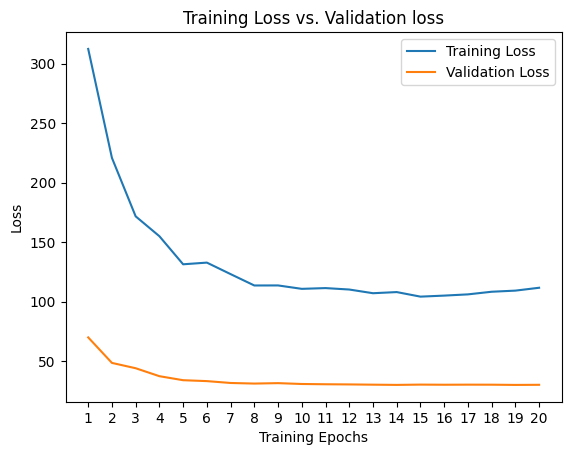

In [35]:
plt.title("Training Loss vs. Validation loss")
plt.xlabel("Training Epochs")
plt.ylabel("Loss")
plt.plot(range(1,num_epochs+1),train_loss,label="Training Loss")
plt.plot(range(1,num_epochs+1),val_loss,label="Validation Loss")
plt.xticks(np.arange(1, num_epochs+1, 1.0))
plt.legend()
plt.show()

In [38]:
import torch
from torchvision.transforms import ToTensor
from PIL import Image
import os

def predict_labels_from_directory(image_dir, model):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]

    for image_file in image_files:
        image_path = os.path.join(image_dir, image_file)
        image = Image.open(image_path)
        image_tensor = ToTensor()(image).unsqueeze(0).to(device)
        output = model(image_tensor)
        probabilities = torch.softmax(output, dim=1)
        predicted_label = torch.argmax(probabilities, dim=1)
        print(f"Image {image_file} predicted label:", predicted_label.item())

image_directory = '/content/output_images'
predict_labels_from_directory(image_directory, model_conv)

Image out15.jpg predicted label: 1
Image out9.jpg predicted label: 1
Image out14.jpg predicted label: 1
Image out8.jpg predicted label: 1
Image out11.jpg predicted label: 0
Image out1.jpg predicted label: 1
Image out6.jpg predicted label: 1
Image out17.jpg predicted label: 1
Image out16.jpg predicted label: 1
Image out19.jpg predicted label: 1
Image out5.jpg predicted label: 1
Image out2.jpg predicted label: 0
Image out13.jpg predicted label: 1
Image out20.jpg predicted label: 1
Image out12.jpg predicted label: 1
Image out4.jpg predicted label: 1
Image out7.jpg predicted label: 1
Image out3.jpg predicted label: 1
Image out10.jpg predicted label: 1
Image out18.jpg predicted label: 1
